In [1]:
# import bin2cell as b2c
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math
import numpy as np

from matplotlib.colors import ListedColormap
from stardist.models import StarDist2D
from csbdeep.utils import normalize
from glob import glob

2024-09-16 16:30:04.421227: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-09-16 16:30:04.460648: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
exec(open('imgshow.py').read())

In [3]:
#from stardist.models import StarDist2D
model = StarDist2D.from_pretrained('2D_versatile_he')

Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.


In [5]:
Visium_mouse_imgs = glob(Visium_mouse_path+"*.tif")

In [6]:
# reorder
Visium_mouse_imgs = Visium_mouse_imgs[2:4] + Visium_mouse_imgs[0:2]

In [7]:
img_N = len(Visium_mouse_imgs)
img_list = [None for x in range(img_N)]
for x in range(img_N):
    img_list[x]=mpimg.imread(Visium_mouse_imgs[x])

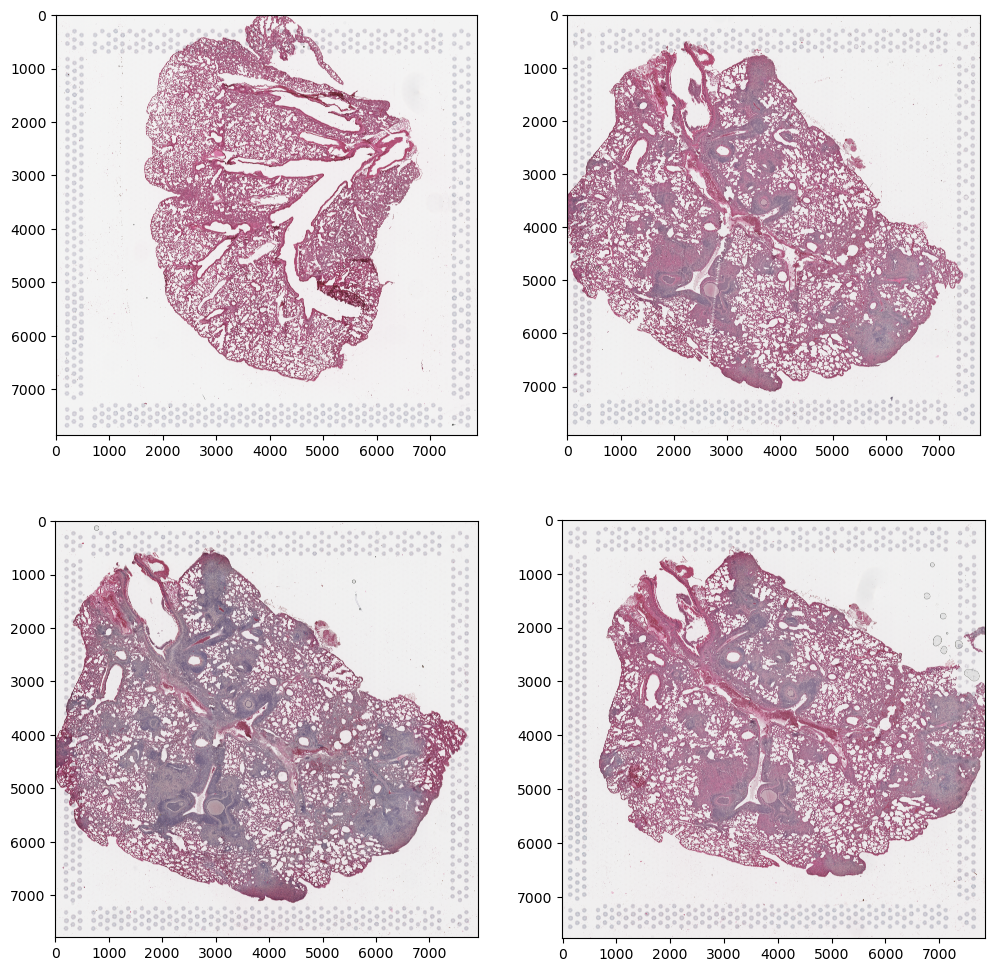

In [8]:
fig, ax = plt.subplots(math.ceil(img_N/2), 2)
fig.set_size_inches(12, 12)
for x in range(img_N):
    ax[math.floor(x/2), x%2].imshow(img_list[x])

In [9]:
img_N = len(Visium_mouse_imgs)
labels = [None for x in range(img_N)]
polys = [None for x in range(img_N)]
for x in range(img_N):
    labels[x], polys[x] = model.predict_instances(normalize(img_list[x]), prob_thresh= 0.01, nms_thresh=0.01)

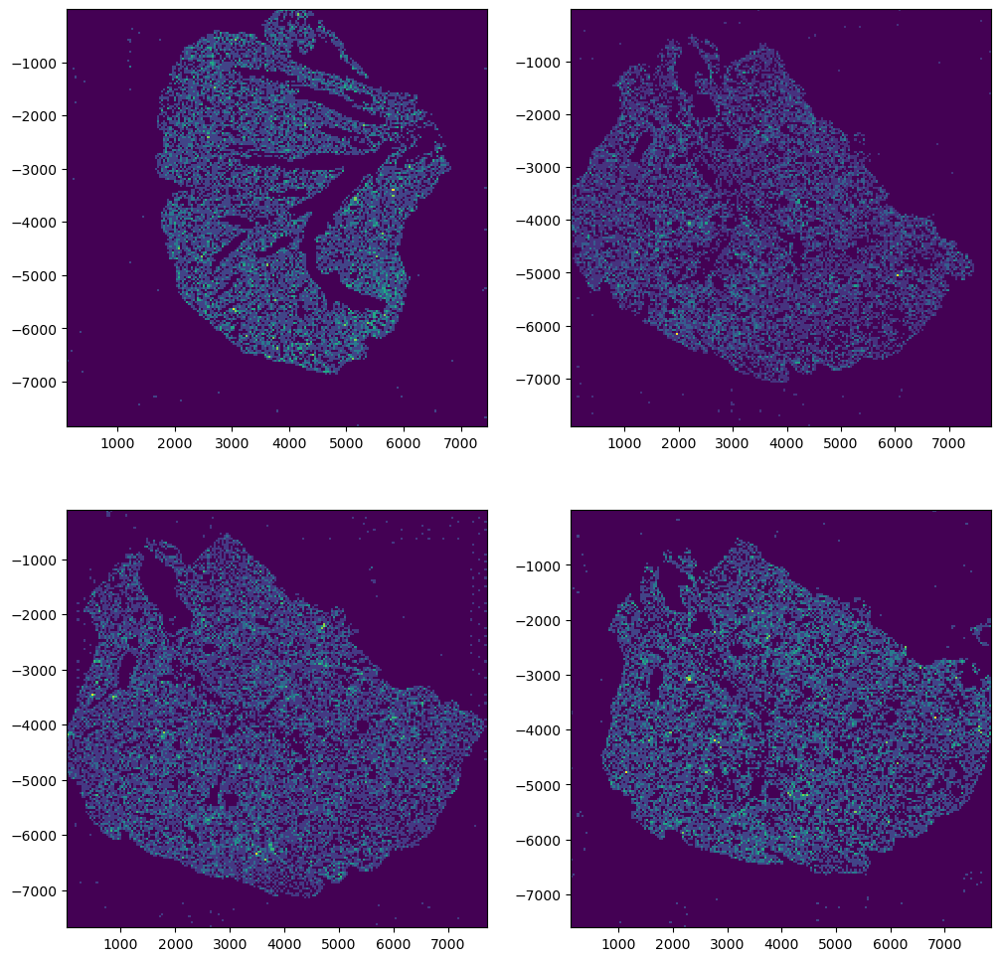

In [10]:
fig, ax = plt.subplots(math.ceil(img_N/2), 2)
fig.set_size_inches(12, 12)
for x in range(img_N):
    y_coords = [-k[0] for k in polys[x]['points']]
    x_coords = [k[1] for k in polys[x]['points']]
    ax[math.floor(x/2), x%2].hist2d(x_coords, y_coords, 200)

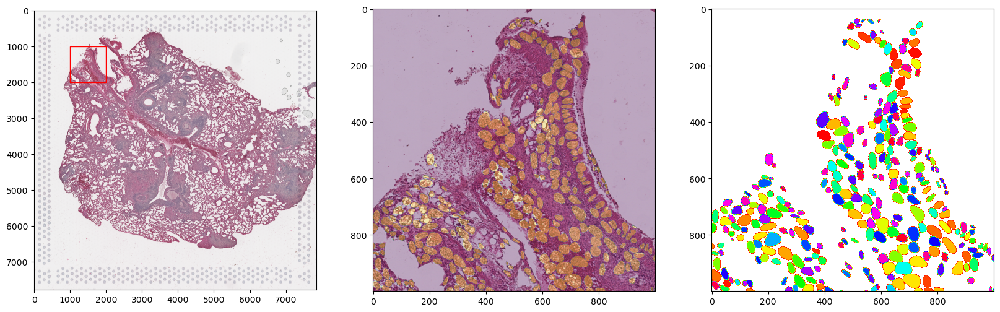

In [11]:
show_cropped_nuclei(img_list[3], labels[3], 1000, 1000, 1000, 1000)

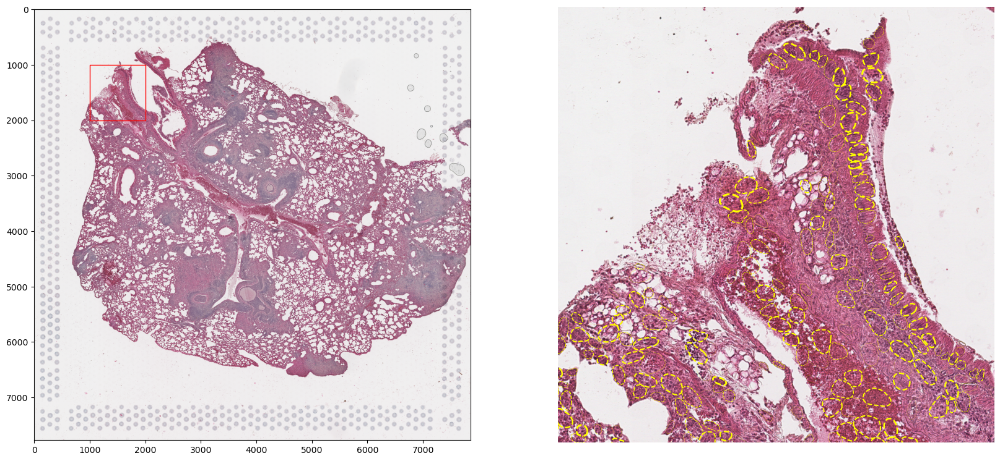

In [12]:
show_cropped_nuclei2(img_list[3], labels[3], polys[3], 1000, 1000, 1000, 1000)

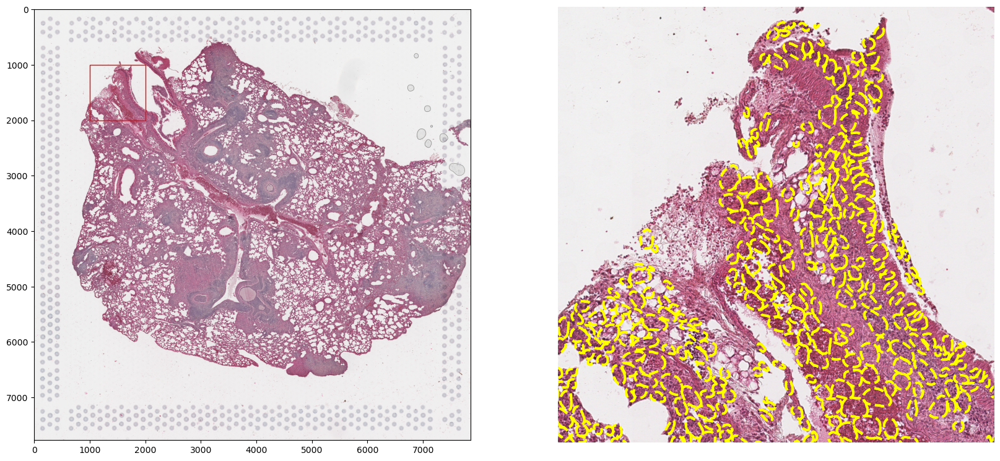

In [13]:
show_cropped_nuclei2(img_list[3], labels[3], polys[3], 1000, 1000, 1000, 1000, probs=False)

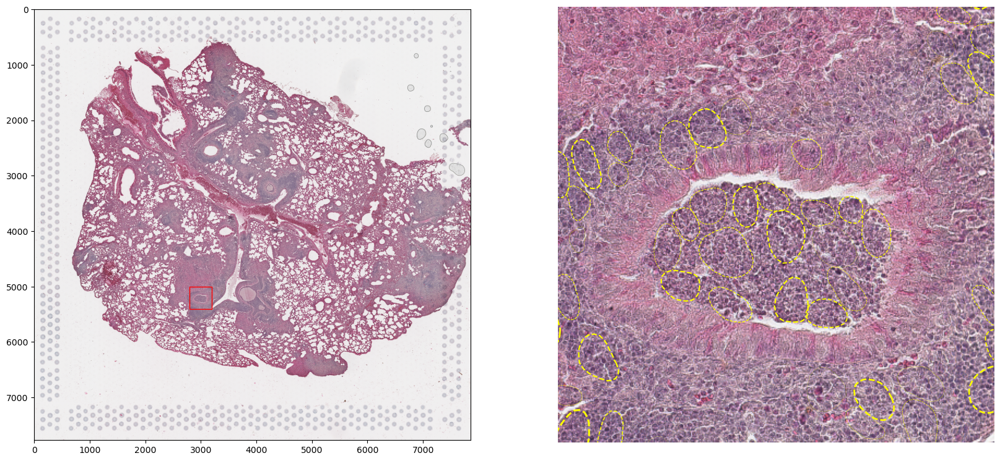

In [14]:
show_cropped_nuclei2(img_list[3], labels[3], polys[3], 2800, 5000, 400, 400)